In [2]:
# Import dependencies
import os, glob, re, pickle
from functools import partial
from collections import OrderedDict
import operator as op
from cytoolz import compose

import numpy as np
import pandas as pd
import scanpy as sc
import scipy as sp
import loompy as lp
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import anndata

from pyscenic.export import export2loom, add_scenic_metadata
from pyscenic.utils import load_motifs
from pyscenic.transform import df2regulons
from pyscenic.aucell import aucell
from pyscenic.binarization import binarize
from pyscenic.rss import regulon_specificity_scores
from pyscenic.plotting import plot_binarization, plot_rss

from IPython.display import HTML, display

# Print date and time:
import datetime
e = datetime.datetime.now()
print ("Current date and time = %s" % e)

Current date and time = 2022-11-10 11:23:29.571613


In [3]:
# set variables for file paths to read from and write to:

# set a working directory
wdir = "/project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/"
os.chdir( wdir )

# folder structures
RESOURCES_FOLDERNAME = "/project/tendonhca/akurjan/SCENIC_dev/resources/"
AUXILLIARIES_FOLDERNAME = "/project/tendonhca/akurjan/SCENIC_dev/auxilliaries/"
RESULTS_FOLDERNAME = "/project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/results/"
FIGURES_FOLDERNAME = "/project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/figures/"

In [4]:
def savesvg(fname: str, fig, folder: str=FIGURES_FOLDERNAME) -> None:
    """
    Save figure as vector-based SVG image format.
    """
    fig.tight_layout()
    fig.savefig(os.path.join(folder, fname), format='svg')

In [5]:
DATASET_ID = "hamstring_updated"

METADATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.metadata.csv'.format(DATASET_ID))
EXP_MTX_QC_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.tpm.csv'.format(DATASET_ID))
EXP_MTX_COUNTS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.qc.counts.csv'.format(DATASET_ID))
ADJACENCIES_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.adjacencies.tsv'.format(DATASET_ID))
MOTIFS_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.motifs.csv'.format(DATASET_ID))
REGULONS_DAT_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.regulons.dat'.format(DATASET_ID))
AUCELL_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.auc.csv'.format(DATASET_ID))
BIN_MTX_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.bin.csv'.format(DATASET_ID))
THR_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.thresholds.csv'.format(DATASET_ID))
ANNDATA_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.h5ad'.format(DATASET_ID))
LOOM_FNAME = os.path.join(RESULTS_FOLDERNAME, '{}.loom'.format(DATASET_ID))

In [5]:
# Set maximum number of jobs for Scanpy.
sc.settings.njobs = 20

# Set folder for saving figures into
sc.settings.figdir = FIGURES_FOLDERNAME

# Set other settings
sc.settings.verbosity = 3 # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=150, fontsize=10, dpi_save=600)

-----
anndata     0.8.0
scanpy      1.9.1
-----
PIL                 9.1.1
attr                21.4.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
boltons             NA
bottleneck          1.3.4
cffi                1.15.0
cloudpickle         2.1.0
colorama            0.4.4
ctxcore             0.2.0
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2022.02.0
dateutil            2.8.2
debugpy             1.6.0
decorator           5.1.1
defusedxml          0.7.1
entrypoints         0.4
frozendict          2.3.2
fsspec              2022.7.1
google              NA
h5py                3.7.0
igraph              0.9.11
ipykernel           6.13.1
ipython_genutils    0.2.0
ipywidgets          8.0.2
jedi                0.18.1
jinja2              3.1.2
joblib              1.1.0
jupyter_server      1.17.1
kiwisolver          1.4.2
leidenalg           0.8.10
llvmlite            0.36.0
loompy              3.0.6
louvain         

Pick and download from https://resources.aertslab.org/cistarget/:

`!wget https://resources.aertslab.org/cistarget/databases/homo_sapiens/hg38/refseq_r80/mc_v10_clust/gene_based/hg38_500bp_up_100bp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather`

`!wget https://resources.aertslab.org/cistarget/databases/homo_sapiens/hg38/refseq_r80/mc_v10_clust/gene_based/hg38_10kbp_up_10kbp_down_full_tx_v10_clust.genes_vs_motifs.rankings.feather`

`!wget https://resources.aertslab.org/cistarget/motif2tf/motifs-v10nr_clust-nr.hgnc-m0.001-o0.0.tbl`

# Data Preparation - Loom File Creation

In [58]:
adata=sc.read("hamstring_integrated_annotated_res0p15_20220922.h5ad")
adata

AnnData object with n_obs × n_vars = 10533 × 23318
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'

In [59]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,nUMI,nGene,log10GenesPerUMI,sample,mtUMI,mitoRatio,scDblFinder.score,...,decontX_clusters,sex,age,batch,side,RNA_snn_res.0.2,seurat_clusters,RNA_snn_res.0.1,RNA_snn_res.0.15,cell_type
AAACCCAAGAAGTCCG_1,HAM_OMB1216,3296.0,1588,3296.0,1588,0.909853,Hamstring0,23.0,0.006978,0.340008,...,1,Male,37,28JAN2021,Right,0,0,0,0,Fast-twitch skeletal muscle cells
AAACCCAAGTTCATCG_1,HAM_OMB1216,2368.0,1128,2368.0,1128,0.904554,Hamstring0,30.0,0.012669,0.003623,...,1,Male,37,28JAN2021,Right,2,0,0,0,Fast-twitch skeletal muscle cells
AAACGAACACATTCGA_1,HAM_OMB1216,1839.0,948,1839.0,948,0.911850,Hamstring0,27.0,0.014682,0.054006,...,1,Male,37,28JAN2021,Right,2,0,0,0,Fast-twitch skeletal muscle cells
AAACGAACATGGAGAC_1,HAM_OMB1216,4179.0,1697,4179.0,1697,0.891913,Hamstring0,20.0,0.004786,0.004322,...,2,Male,37,28JAN2021,Right,3,4,3,4,Slow-twitch skeletal muscle cells
AAACGAATCCTCATAT_1,HAM_OMB1216,2098.0,1235,2098.0,1235,0.930719,Hamstring0,25.0,0.011916,0.002427,...,2,Male,37,28JAN2021,Right,3,4,3,4,Slow-twitch skeletal muscle cells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTAGTGGACTG,HAM_OMB0782,2077.0,1150,2077.0,1150,0.922609,Hamstring5,30.0,0.014444,0.234771,...,3,Female,18,16MAR2021,Left,1,1,1,1,PDGFRA+ Fibroblasts
TTTGGTTCAGTAGATA,HAM_OMB0782,2046.0,993,2046.0,993,0.905175,Hamstring5,16.0,0.007820,0.171304,...,5,Female,18,16MAR2021,Left,6,2,2,2,MKX+ Fibroblasts
TTTGTTGAGTGCAGCA,HAM_OMB0782,4891.0,1852,4891.0,1852,0.885684,Hamstring5,11.0,0.002249,0.256161,...,1,Female,18,16MAR2021,Left,2,0,0,0,Fast-twitch skeletal muscle cells
TTTGTTGCATGTACGT,HAM_OMB0782,2320.0,1169,2320.0,1169,0.911551,Hamstring5,10.0,0.004310,0.309562,...,1,Female,18,16MAR2021,Left,0,3,0,3,Transitional skeletal muscle cells


In [60]:
adata.obs.index = adata.obs.index.str.split('_').str[0]
adata.obs['barcode'] = adata.obs.index
adata.obs['CellID'] = adata.obs['barcode'].astype(str) + '.' + adata.obs['orig.ident'].astype(str) 
adata.obs.index = adata.obs['CellID']
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,nUMI,nGene,log10GenesPerUMI,sample,mtUMI,mitoRatio,scDblFinder.score,...,age,batch,side,RNA_snn_res.0.2,seurat_clusters,RNA_snn_res.0.1,RNA_snn_res.0.15,cell_type,barcode,CellID
CellID,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAAGTCCG.HAM_OMB1216,HAM_OMB1216,3296.0,1588,3296.0,1588,0.909853,Hamstring0,23.0,0.006978,0.340008,...,37,28JAN2021,Right,0,0,0,0,Fast-twitch skeletal muscle cells,AAACCCAAGAAGTCCG,AAACCCAAGAAGTCCG.HAM_OMB1216
AAACCCAAGTTCATCG.HAM_OMB1216,HAM_OMB1216,2368.0,1128,2368.0,1128,0.904554,Hamstring0,30.0,0.012669,0.003623,...,37,28JAN2021,Right,2,0,0,0,Fast-twitch skeletal muscle cells,AAACCCAAGTTCATCG,AAACCCAAGTTCATCG.HAM_OMB1216
AAACGAACACATTCGA.HAM_OMB1216,HAM_OMB1216,1839.0,948,1839.0,948,0.911850,Hamstring0,27.0,0.014682,0.054006,...,37,28JAN2021,Right,2,0,0,0,Fast-twitch skeletal muscle cells,AAACGAACACATTCGA,AAACGAACACATTCGA.HAM_OMB1216
AAACGAACATGGAGAC.HAM_OMB1216,HAM_OMB1216,4179.0,1697,4179.0,1697,0.891913,Hamstring0,20.0,0.004786,0.004322,...,37,28JAN2021,Right,3,4,3,4,Slow-twitch skeletal muscle cells,AAACGAACATGGAGAC,AAACGAACATGGAGAC.HAM_OMB1216
AAACGAATCCTCATAT.HAM_OMB1216,HAM_OMB1216,2098.0,1235,2098.0,1235,0.930719,Hamstring0,25.0,0.011916,0.002427,...,37,28JAN2021,Right,3,4,3,4,Slow-twitch skeletal muscle cells,AAACGAATCCTCATAT,AAACGAATCCTCATAT.HAM_OMB1216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,HAM_OMB0782,2077.0,1150,2077.0,1150,0.922609,Hamstring5,30.0,0.014444,0.234771,...,18,16MAR2021,Left,1,1,1,1,PDGFRA+ Fibroblasts,TTTGACTAGTGGACTG,TTTGACTAGTGGACTG.HAM_OMB0782
TTTGGTTCAGTAGATA.HAM_OMB0782,HAM_OMB0782,2046.0,993,2046.0,993,0.905175,Hamstring5,16.0,0.007820,0.171304,...,18,16MAR2021,Left,6,2,2,2,MKX+ Fibroblasts,TTTGGTTCAGTAGATA,TTTGGTTCAGTAGATA.HAM_OMB0782
TTTGTTGAGTGCAGCA.HAM_OMB0782,HAM_OMB0782,4891.0,1852,4891.0,1852,0.885684,Hamstring5,11.0,0.002249,0.256161,...,18,16MAR2021,Left,2,0,0,0,Fast-twitch skeletal muscle cells,TTTGTTGAGTGCAGCA,TTTGTTGAGTGCAGCA.HAM_OMB0782


In [61]:
adata.var

,vst.mean,vst.variance,vst.variance.expected,vst.variance.standardized,vst.variable
ENSG00000001460,0.039970,0.048820,0.057396,0.850581,False
ENSG00000001461,0.039875,0.059367,0.057249,1.037001,False
ENSG00000010072,0.050223,0.063087,0.073751,0.855409,False
ENSG00000009780,0.156081,0.208261,0.271665,0.766610,False
ENSG00000048707,1.391436,3.137591,5.415922,0.579327,False
...,...,...,...,...,...
ENSG00000261696,0.000475,0.000475,0.000508,0.934407,False
ENSG00000126752,0.000285,0.000285,0.000297,0.959390,False
ENSG00000228459,0.000949,0.002278,0.001055,1.719799,True
ENSG00000278057,0.000095,0.000095,0.000094,1.000190,False


In [62]:
annot = sc.queries.biomart_annotations(
        "hsapiens",
        ["ensembl_gene_id", "external_gene_name", "chromosome_name"],
        #host="asia.ensembl.org", 
        use_cache=True
    ).set_index("ensembl_gene_id")
adata.var[annot.columns] = annot
adata.var

,vst.mean,vst.variance,vst.variance.expected,vst.variance.standardized,vst.variable,external_gene_name,chromosome_name
ENSG00000001460,0.039970,0.048820,0.057396,0.850581,False,STPG1,1
ENSG00000001461,0.039875,0.059367,0.057249,1.037001,False,NIPAL3,1
ENSG00000010072,0.050223,0.063087,0.073751,0.855409,False,SPRTN,1
ENSG00000009780,0.156081,0.208261,0.271665,0.766610,False,FAM76A,1
ENSG00000048707,1.391436,3.137591,5.415922,0.579327,False,VPS13D,1
...,...,...,...,...,...,...,...
ENSG00000261696,0.000475,0.000475,0.000508,0.934407,False,NaN,9
ENSG00000126752,0.000285,0.000285,0.000297,0.959390,False,SSX1,X
ENSG00000228459,0.000949,0.002278,0.001055,1.719799,True,LINC01546,X
ENSG00000278057,0.000095,0.000095,0.000094,1.000190,False,TEX28,X


In [63]:
adata.var['gene_id'] = adata.var.index 
adata.var["external_gene_name"] = adata.var["external_gene_name"].fillna(adata.var['gene_id'])
adata.var.index = adata.var["external_gene_name"]
adata.var.index.rename('Gene', inplace=True)
adata.var

,vst.mean,vst.variance,vst.variance.expected,vst.variance.standardized,vst.variable,external_gene_name,chromosome_name,gene_id
Gene,,,,,,,,
STPG1,0.039970,0.048820,0.057396,0.850581,False,STPG1,1,ENSG00000001460
NIPAL3,0.039875,0.059367,0.057249,1.037001,False,NIPAL3,1,ENSG00000001461
SPRTN,0.050223,0.063087,0.073751,0.855409,False,SPRTN,1,ENSG00000010072
FAM76A,0.156081,0.208261,0.271665,0.766610,False,FAM76A,1,ENSG00000009780
VPS13D,1.391436,3.137591,5.415922,0.579327,False,VPS13D,1,ENSG00000048707
...,...,...,...,...,...,...,...,...
ENSG00000261696,0.000475,0.000475,0.000508,0.934407,False,ENSG00000261696,9,ENSG00000261696
SSX1,0.000285,0.000285,0.000297,0.959390,False,SSX1,X,ENSG00000126752
LINC01546,0.000949,0.002278,0.001055,1.719799,True,LINC01546,X,ENSG00000228459


In [64]:
sc.pp.filter_genes(adata, min_counts=3)

filtered out 549 genes that are detected in less than 3 counts


/home/a/akurjan/.local/lib/python3.7/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [65]:
adata.var_names_make_unique()

In [66]:
adata.var_names.is_unique

True

In [67]:
# check the counts
print(adata.X.shape)
print(adata.X[:10,:10])

(10533, 22769)
  (7, 1)	2.0
  (8, 3)	1.0
  (2, 4)	2.0
  (3, 4)	4.0
  (5, 4)	5.0
  (6, 4)	3.0
  (7, 4)	5.0
  (8, 4)	1.0
  (9, 4)	2.0
  (0, 6)	2.0
  (4, 6)	2.0


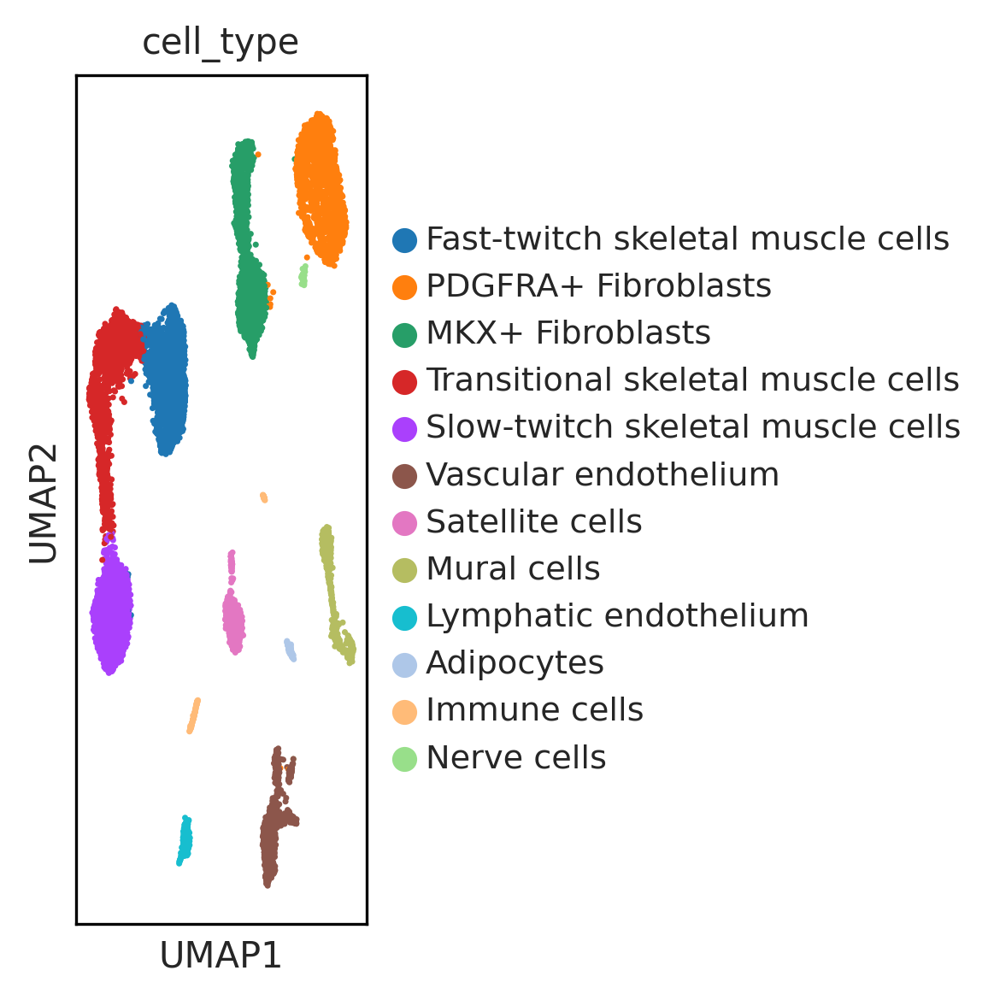

In [68]:
sc.pl.umap(adata,color='cell_type')

In [69]:
adata.write('hamstring_cellxgene_annotated.h5ad')

## Loom File Creation for SCENIC

In [70]:
scenicdata=sc.AnnData(adata.X,obs=adata.obs,var=adata.var)
print(scenicdata.var_names)
print(scenicdata.obs_names)

Index(['STPG1', 'NIPAL3', 'SPRTN', 'FAM76A', 'VPS13D', 'MYOC', 'TARBP1',
       'THAP3', 'VAMP3', 'UTS2',
       ...
       'ENSG00000253449', 'LINC01947', 'GLYATL3', 'SPDEF', 'NRSN1', 'CT69',
       'ENSG00000234675', 'ENSG00000261696', 'SSX1', 'LINC01546'],
      dtype='object', name='Gene', length=22769)
Index(['AAACCCAAGAAGTCCG.HAM_OMB1216', 'AAACCCAAGTTCATCG.HAM_OMB1216',
       'AAACGAACACATTCGA.HAM_OMB1216', 'AAACGAACATGGAGAC.HAM_OMB1216',
       'AAACGAATCCTCATAT.HAM_OMB1216', 'AAACGAATCGAGAGCA.HAM_OMB1216',
       'AAACGAATCTGACGCG.HAM_OMB1216', 'AAACGCTAGTGCTCGC.HAM_OMB1216',
       'AAACGCTCAAAGACTA.HAM_OMB1216', 'AAACGCTCAAATGGTA.HAM_OMB1216',
       ...
       'TTTCCTCGTCAAATCC.HAM_OMB0782', 'TTTCCTCTCCCGAGAC.HAM_OMB0782',
       'TTTCGATAGGTACAGC.HAM_OMB0782', 'TTTCGATGTATCCCTC.HAM_OMB0782',
       'TTTCGATTCACCTCTG.HAM_OMB0782', 'TTTGACTAGTGGACTG.HAM_OMB0782',
       'TTTGGTTCAGTAGATA.HAM_OMB0782', 'TTTGTTGAGTGCAGCA.HAM_OMB0782',
       'TTTGTTGCATGTACGT.HAM_OMB0782', 'T

In [71]:
scenicdata

AnnData object with n_obs × n_vars = 10533 × 22769
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'external_gene_name', 'chromosome_name', 'gene_id', 'n_counts'

In [72]:
scenicdata.write_loom("hamstring.loom")

# SCENIC

#### STEP 1: Network inference based on GRNBoost2:
`pyscenic grn \
        /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.loom \
        /project/tendonhca/akurjan/SCENIC_dev/auxilliaries/allTFs_hg38.txt \
        -o /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.adjacencies.tsv \
        --seed 4000 \
        --num_workers 70 && \`

#### STEP2: Regulon prediction aka cisTarget:
`pyscenic ctx \
        /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.adjacencies.tsv \
        /project/tendonhca/akurjan/SCENIC_dev/auxilliaries/older/hg38__refseq-r80__10kb_up_and_down_tss.mc9nr.feather\
        /project/tendonhca/akurjan/SCENIC_dev/auxilliaries/older/hg38__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr.feather \
        --annotations_fname /project/tendonhca/akurjan/SCENIC_dev/auxilliaries/older/motifs-v9-nr.hgnc-m0.001-o0.0.tbl \
        --expression_mtx_fname /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.loom \
        --output /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.motifs.csv \
        --mode "dask_multiprocessing" \
        --num_workers 70 && \`

#### STEP3: AUCELL
`pyscenic aucell \
    /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.loom \
    /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.motifs.csv \
    -o /project/tendonhca/akurjan/SCENIC_dev/HamstringPaper_updated/hamstring.scenic.loom \
    --num_workers 70`

#### Checking Motifs and Deriving Important Regulons (step 2)

In [28]:
df_motifs = load_motifs('hamstring.motifs.csv')

In [8]:
def derive_regulons(motifs, db_names=('hg38__refseq-r80__10kb_up_and_down_tss.mc9nr', 
                                      'hg38__refseq-r80__500bp_up_and_100bp_down_tss.mc9nr')):
    motifs.columns = motifs.columns.droplevel(0)

    def contains(*elems):
        def f(context):
            return any(elem in context for elem in elems)
        return f

    # For the creation of regulons we only keep the 10-species databases and the activating modules. We also remove the
    # enriched motifs for the modules that were created using the method 'weight>50.0%' (because these modules are not part
    # of the default settings of modules_from_adjacencies anymore.
    motifs = motifs[
        np.fromiter(map(compose(op.not_, contains('weight>50.0%')), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains(*db_names), motifs.Context), dtype=np.bool) & \
        np.fromiter(map(contains('activating'), motifs.Context), dtype=np.bool)]

    # We build regulons only using enriched motifs with a NES of 3.0 or higher; we take only directly annotated TFs or TF annotated
    # for an orthologous gene into account; and we only keep regulons with at least 10 genes.
    regulons = list(filter(lambda r: len(r) >= 10, df2regulons(motifs[(motifs['NES'] >= 3.0) 
                                                                      & ((motifs['Annotation'] == 'gene is directly annotated')
                                                                        | (motifs['Annotation'].str.startswith('gene is orthologous to')
                                                                           & motifs['Annotation'].str.endswith('which is directly annotated for motif')))
                                                                     ])))
    
    # Rename regulons, i.e. remove suffix.
    return list(map(lambda r: r.rename(r.transcription_factor), regulons))

In [29]:
regulons = derive_regulons(df_motifs)
len(regulons)

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from ipykernel import kernelapp as app
/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Create regulons from a dataframe of enriched features.
Additional columns saved: []


117

In [10]:
# Pickle these regulons.
with open('hamstring.regulons.dat', 'wb') as f:
    pickle.dump(regulons, f)

#### Checking parameters for AUCELL (step 3)

It is important to check that most cells have a substantial fraction of expressed/detected genes in the calculation of the AUC. The following histogram gives an idea of the distribution and allows selection of an appropriate threshold. In this plot, a few thresholds are highlighted, with the number of genes selected shown in red text and the corresponding percentile in parentheses). See the relevant section in the R tutorial for more information.

By using the default setting for --auc_threshold of 0.05, we see that 791 genes are selected for the rankings based on the plot below.

0.01     639.0
0.05     785.0
0.10     893.0
0.50    1505.0
1.00    2999.0
Name: 0, dtype: float64


/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


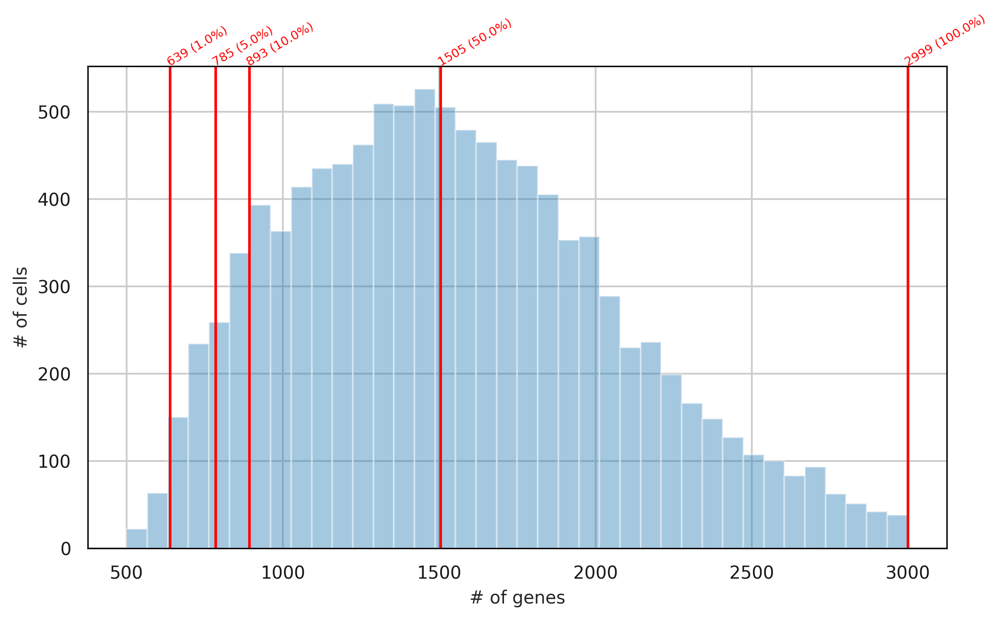

In [73]:
# Check thresholds for aucell
nGenesDetectedPerCell = pd.DataFrame(np.sum(adata.X>0, axis=1))
nGenesDetectedPerCell = nGenesDetectedPerCell.squeeze()

percentiles = nGenesDetectedPerCell.quantile([0.01, 0.05, 0.10, 0.50, 1])
print(percentiles)

fig, ax = plt.subplots(1, 1, figsize=(8, 5), dpi=150)
sns.distplot(nGenesDetectedPerCell, norm_hist=False, kde=False, bins='fd')
for i,x in enumerate(percentiles):
    fig.gca().axvline(x=x, ymin=0,ymax=1, color='red')
    ax.text(x=x, y=ax.get_ylim()[1], s=f'{int(x)} ({percentiles.index.values[i]*100}%)', color='red', rotation=30, size='x-small',rotation_mode='anchor' )
ax.set_xlabel('# of genes')
ax.set_ylabel('# of cells')
fig.tight_layout()

# Visualization of SCENIC's AUC matrix

In [9]:
adata = sc.read_h5ad('hamstring_cellxgene_annotated.h5ad')

In [6]:
lf = lp.connect("hamstring.scenic.loom", mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
#exprMat = pd.DataFrame( lf[:,:], index=lf.ra.Gene, columns=lf.ca.CellID)
regulons = lf.ra.Regulons
#res=pd.concat([pd.Series(r.tolist(),index=regulons.dtype.names) for r in regulons],axis=1)
#res.columns=lf.row_attrs["Gene"]
#res.to_csv("results/hamstring.regulon_mat.csv")
lf.close()

In [7]:
auc_mtx

,AHR(+),AR(+),ARID3A(+),ARNT(+),ARNT2(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),ATF6(+),...,ZNF502(+),ZNF516(+),ZNF540(+),ZNF544(+),ZNF607(+),ZNF84(+),ZNF845(+),ZNF91(+),ZSCAN31(+),ZSCAN4(+)
AAACCCAAGAAGTCCG.HAM_OMB1216,0.000000,0.147627,0.008885,0.086619,0.000000,0.074455,0.134346,0.051728,0.088592,0.075790,...,0.074912,0.166800,0.000000,0.101152,0.060633,0.007469,0.000000,0.090019,0.050439,0.000000
AAACCCAAGTTCATCG.HAM_OMB1216,0.000000,0.000000,0.015092,0.117924,0.056798,0.102905,0.157068,0.057293,0.095223,0.097107,...,0.042765,0.155456,0.114455,0.022749,0.006298,0.108475,0.000000,0.125257,0.000000,0.000000
AAACGAACACATTCGA.HAM_OMB1216,0.000000,0.000000,0.005091,0.099443,0.181339,0.084813,0.105599,0.038664,0.081083,0.097920,...,0.013694,0.016536,0.000000,0.039153,0.053676,0.024165,0.000000,0.120171,0.111248,0.000000
AAACGAACATGGAGAC.HAM_OMB1216,0.000000,0.186292,0.013837,0.124725,0.144112,0.107826,0.151519,0.068307,0.006551,0.108041,...,0.063635,0.000000,0.148726,0.104081,0.000000,0.096026,0.000000,0.156143,0.029701,0.000000
AAACGAATCCTCATAT.HAM_OMB1216,0.000000,0.000000,0.022917,0.099453,0.165681,0.102295,0.127065,0.064675,0.000000,0.079398,...,0.115920,0.059914,0.117970,0.084749,0.077329,0.074204,0.000000,0.127804,0.039016,0.001054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,0.000000,0.260457,0.033629,0.093823,0.058316,0.079252,0.088953,0.000000,0.084678,0.089103,...,0.092487,0.035709,0.119947,0.077719,0.005785,0.152949,0.237368,0.112268,0.000000,0.000000
TTTGGTTCAGTAGATA.HAM_OMB0782,0.000000,0.042882,0.058262,0.057932,0.000000,0.058286,0.053276,0.106561,0.000000,0.072741,...,0.219684,0.074053,0.000000,0.159734,0.192663,0.178969,0.000000,0.090092,0.101582,0.018043
TTTGTTGAGTGCAGCA.HAM_OMB0782,0.000000,0.144112,0.012958,0.111865,0.115833,0.148754,0.157871,0.000000,0.047851,0.064290,...,0.043351,0.060153,0.005053,0.059266,0.024531,0.054970,0.000000,0.128066,0.000000,0.000000
TTTGTTGCATGTACGT.HAM_OMB0782,0.000000,0.000000,0.000544,0.100139,0.106806,0.124512,0.094326,0.032572,0.054402,0.095738,...,0.113869,0.117191,0.235721,0.102812,0.000000,0.094513,0.000000,0.112952,0.000000,0.022964


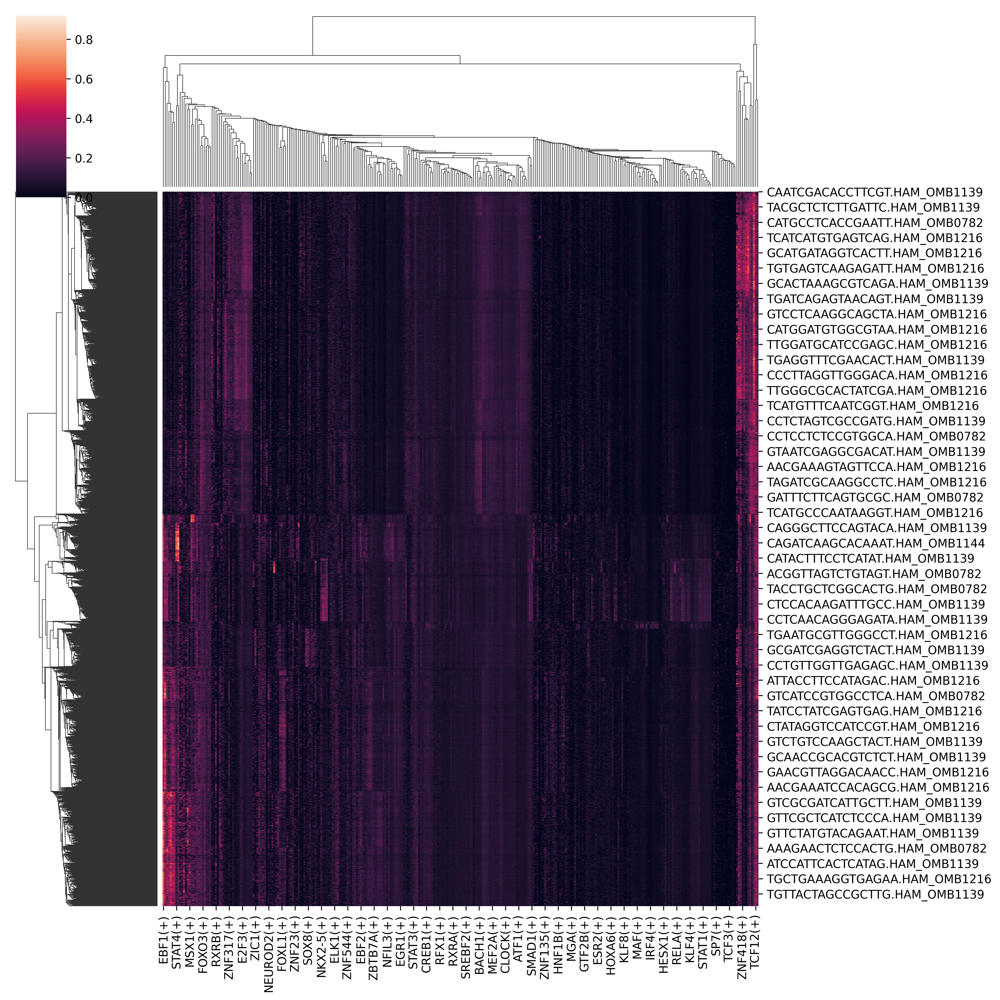

In [9]:
sns.clustermap(auc_mtx, figsize=(12,12))

#### Regulon Binarization

In [77]:
%%time
# bin_mtx, thresholds = binarize(auc_mtx) 

CPU times: user 1.28 s, sys: 577 ms, total: 1.86 s
Wall time: 30min 5s


In [78]:
# bin_mtx.to_csv(BIN_MTX_FNAME) 
# thresholds.to_frame().rename(columns={0:'threshold'}).to_csv(THR_FNAME)

In [11]:
bin_mtx = pd.read_csv('results/hamstring_updated.bin.csv', index_col=0)
thresholds = pd.read_csv('results/hamstring_updated.thresholds.csv', index_col=0).threshold

In [12]:
bin_mtx

,AHR(+),AR(+),ARID3A(+),ARNT(+),ARNT2(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),ATF6(+),...,ZNF502(+),ZNF516(+),ZNF540(+),ZNF544(+),ZNF607(+),ZNF84(+),ZNF845(+),ZNF91(+),ZSCAN31(+),ZSCAN4(+)
AAACCCAAGAAGTCCG.HAM_OMB1216,0,1,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,1,0
AAACCCAAGTTCATCG.HAM_OMB1216,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
AAACGAACACATTCGA.HAM_OMB1216,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
AAACGAACATGGAGAC.HAM_OMB1216,0,1,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,1,0,0
AAACGAATCCTCATAT.HAM_OMB1216,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,0,1,0,0,1,0,0,0,0,0,...,0,0,1,0,0,1,1,0,0,0
TTTGGTTCAGTAGATA.HAM_OMB0782,0,0,1,0,0,0,0,0,0,0,...,1,0,0,1,1,1,0,0,1,0
TTTGTTGAGTGCAGCA.HAM_OMB0782,0,1,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
TTTGTTGCATGTACGT.HAM_OMB0782,0,0,0,0,1,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [13]:
thresholds

AHR(+)        0.036953
AR(+)         0.047270
ARID3A(+)     0.055232
ARNT(+)       0.145822
ARNT2(+)      0.029355
                ...   
ZNF84(+)      0.143327
ZNF845(+)     0.039192
ZNF91(+)      0.150808
ZSCAN31(+)    0.035061
ZSCAN4(+)     0.259204
Name: threshold, Length: 317, dtype: float64

In [14]:
# Create heatmap with binarized regulon activity.

def palplot(pal, names, colors=None, size=1):
    n = len(pal)
    f, ax = plt.subplots(1, 1, figsize=(n * size, size))
    ax.imshow(np.arange(n).reshape(1, n),
              cmap=mpl.colors.ListedColormap(list(pal)),
              interpolation="nearest", aspect="auto")
    ax.set_xticks(np.arange(n) - .5)
    ax.set_yticks([-.5, .5])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    colors = n * ['k'] if colors is None else colors
    for idx, (name, color) in enumerate(zip(names, colors)):
        ax.text(0.0+idx, 0.0, name, color=color, horizontalalignment='center', verticalalignment='center')
    return f

In [18]:
cats = sorted(list(set(adata.obs['cell_type'])))
seurat_col = sns.color_palette(['#c77cff',
                                '#F7766D',
                                '#F564E4',
                                '#619CFF',
                                '#B79F00',
                                '#3EB5F0',
                                '#F764B0',
                                '#DE8C00',
                                '#3DBFC4',
                                '#34BA38',
                                '#7CAE00',
                                '#39C08B'])
colorsd = dict( zip( cats, seurat_col ))
colormap = [ colorsd[x] for x in adata.obs['cell_type'] ]

In [19]:
cell_id2cell_type_lut = adata.obs['cell_type'].to_dict()
bw_palette = sns.xkcd_palette(["white", "black"])

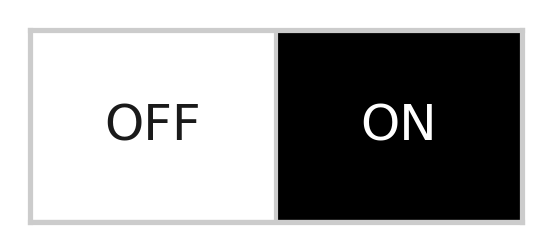

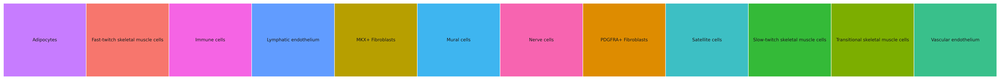

In [23]:
sns.set()
sns.set_style("whitegrid")
fig = palplot(bw_palette, ['OFF', 'ON'], ['k', 'w'])
savesvg('hamstring - on_off.svg', fig)

sns.set()
sns.set(font_scale=0.8)
fig = palplot( seurat_col, cats, size=2.5)
savesvg('hamstring - cell_type_colors.svg', fig)

#sns.set()
#sns.set(font_scale=1.0)
#fig = palplot(sns.color_palette(COLORS), adata.obs['CellType'].dtype.categories, size=3.0)

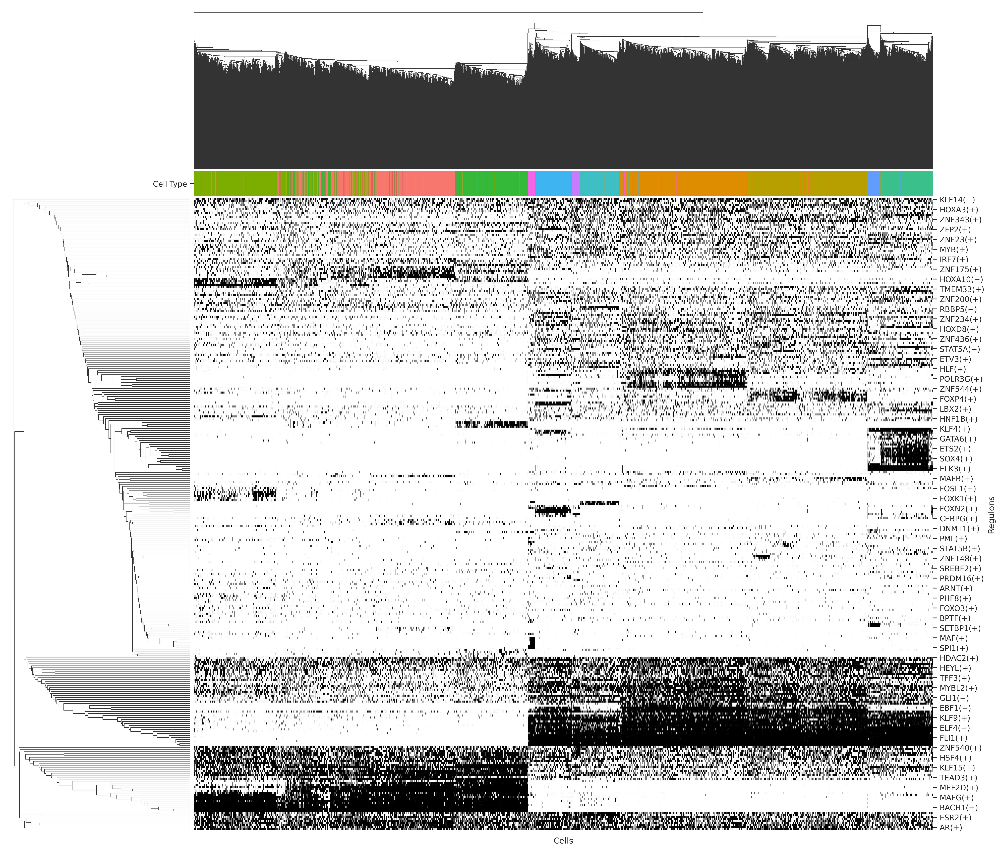

In [24]:
sns.set()
sns.set(font_scale=1.0)
sns.set_style("ticks", {"xtick.minor.size": 1, "ytick.minor.size": 0.1})
g = sns.clustermap(bin_mtx.T, 
               col_colors=auc_mtx.index.map(cell_id2cell_type_lut).map(colorsd),
               cmap=bw_palette, figsize=(20,20))
g.ax_heatmap.set_xticklabels([])
g.ax_heatmap.set_xticks([])
g.ax_heatmap.set_xlabel('Cells')
g.ax_heatmap.set_ylabel('Regulons')
g.ax_col_colors.set_yticks([0.5])
g.ax_col_colors.set_yticklabels(['Cell Type'])
g.cax.set_visible(False)
g.fig.savefig(os.path.join(FIGURES_FOLDERNAME, 'BinaryClustermapHamstring.png'), format='png')

In [88]:
bin_mtx_clustered = bin_mtx.T.copy()
bin_mtx_clustered.rename(columns=adata.obs['cell_type'].to_dict(), inplace=True)

In [89]:
bin_mtx_clustered

,Fast-twitch skeletal muscle cells,Fast-twitch skeletal muscle cells,Fast-twitch skeletal muscle cells,Slow-twitch skeletal muscle cells,Slow-twitch skeletal muscle cells,Slow-twitch skeletal muscle cells,Transitional skeletal muscle cells,Fast-twitch skeletal muscle cells,Slow-twitch skeletal muscle cells,Slow-twitch skeletal muscle cells,...,Transitional skeletal muscle cells,Fast-twitch skeletal muscle cells,PDGFRA+ Fibroblasts,PDGFRA+ Fibroblasts,Vascular endothelium,PDGFRA+ Fibroblasts,MKX+ Fibroblasts,Fast-twitch skeletal muscle cells,Transitional skeletal muscle cells,Transitional skeletal muscle cells
AHR(+),0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
AR(+),1,0,0,1,0,1,0,1,1,1,...,0,0,1,1,0,1,0,1,0,0
ARID3A(+),0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,1,0,0,0
ARNT(+),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
ARNT2(+),0,1,1,1,1,1,1,1,0,1,...,1,1,0,1,0,1,0,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF84(+),0,0,0,0,0,0,0,0,0,0,...,0,0,1,1,0,1,1,0,0,0
ZNF845(+),0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,1
ZNF91(+),0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
ZSCAN31(+),1,0,1,0,1,1,0,0,1,0,...,0,0,0,0,0,0,1,0,0,1


In [90]:
bin_mtx_clustered.iloc[g.dendrogram_row.reordered_ind, g.dendrogram_col.reordered_ind].to_excel(os.path.join(RESULTS_FOLDERNAME, 'Hamstring Binarized regulon activity.xlsx'))

### Regulon specificity scores (RSS) across predicted cell types

In [11]:
rss = regulon_specificity_scores(auc_mtx, adata.obs['cell_type'])
rss

,AHR(+),AR(+),ARID3A(+),ARNT(+),ARNT2(+),ATF1(+),ATF2(+),ATF3(+),ATF4(+),ATF6(+),...,ZNF502(+),ZNF516(+),ZNF540(+),ZNF544(+),ZNF607(+),ZNF84(+),ZNF845(+),ZNF91(+),ZSCAN31(+),ZSCAN4(+)
Fast-twitch skeletal muscle cells,0.222721,0.313572,0.271530,0.340051,0.353587,0.347501,0.330432,0.252864,0.315833,0.328917,...,0.324252,0.283555,0.270578,0.287372,0.254790,0.313417,0.186133,0.340519,0.237175,0.207591
Slow-twitch skeletal muscle cells,0.224891,0.266875,0.229817,0.296749,0.261165,0.336568,0.302327,0.251071,0.262941,0.294593,...,0.255735,0.253059,0.253027,0.256716,0.242742,0.267065,0.199288,0.316960,0.354174,0.192568
Transitional skeletal muscle cells,0.253692,0.272331,0.250651,0.348806,0.336377,0.339668,0.318812,0.220853,0.327705,0.333315,...,0.273492,0.331203,0.319958,0.307791,0.254151,0.256647,0.274318,0.330191,0.237155,0.237105
Mural cells,0.233232,0.208028,0.258659,0.223607,0.234916,0.224532,0.230207,0.269381,0.217813,0.229748,...,0.214765,0.223575,0.200947,0.226151,0.234143,0.229156,0.206013,0.223623,0.198909,0.213859
PDGFRA+ Fibroblasts,0.255910,0.339107,0.349992,0.317691,0.290114,0.295127,0.309068,0.293895,0.288515,0.313035,...,0.332435,0.324894,0.327452,0.336405,0.308667,0.391613,0.455571,0.310817,0.238804,0.309943
Lymphatic endothelium,0.183531,0.183238,0.203393,0.190454,0.180636,0.188969,0.192833,0.182805,0.192507,0.196903,...,0.192238,0.190846,0.219303,0.187726,0.207266,0.199295,0.170370,0.191038,0.181735,0.348165
MKX+ Fibroblasts,0.258523,0.308160,0.382929,0.299306,0.257274,0.285802,0.301891,0.341774,0.294948,0.311295,...,0.342827,0.339839,0.273301,0.330759,0.396324,0.332757,0.261887,0.308739,0.235824,0.299207
Vascular endothelium,0.225927,0.212532,0.253613,0.237472,0.222159,0.243464,0.264858,0.278892,0.274276,0.251285,...,0.252731,0.239017,0.206726,0.245973,0.236909,0.216795,0.196664,0.238895,0.199632,0.331016
Immune cells,0.196411,0.183189,0.214275,0.185479,0.178921,0.181497,0.185041,0.190569,0.183404,0.189762,...,0.182861,0.188544,0.180988,0.181435,0.189028,0.180232,0.189964,0.183470,0.184204,0.189746
Satellite cells,0.204655,0.226143,0.233845,0.232104,0.226664,0.224648,0.241024,0.288355,0.225481,0.238085,...,0.244655,0.226510,0.211165,0.244224,0.209583,0.223288,0.287016,0.232875,0.206633,0.230260


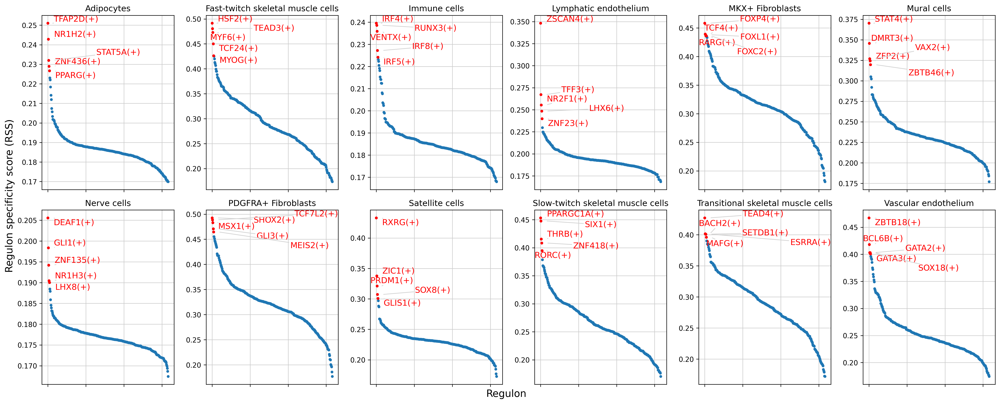

In [17]:
from adjustText import adjust_text

cats = sorted(list(set(adata.obs['cell_type'])))

fig = plt.figure(figsize=(20, 8))
for c,num in zip(cats, range(1,len(cats)+1)):
    x=rss.T[c]
    ax = fig.add_subplot(2,6,num)
    plot_rss(rss, c, top_n=5, max_n=None, ax=ax)
    ax.set_ylim( x.min()-(x.max()-x.min())*0.05 , x.max()+(x.max()-x.min())*0.05 )
    for t in ax.texts:
        t.set_fontsize(12)
    ax.set_ylabel('')
    ax.set_xlabel('')
    adjust_text(ax.texts, autoalign='xy', ha='right', va='bottom', arrowprops=dict(arrowstyle='-',color='lightgrey'), precision=0.001 )
 
fig.text(0.5, 0.0, 'Regulon', ha='center', va='center', size='x-large')
fig.text(0.00, 0.5, 'Regulon specificity score (RSS)', ha='center', va='center', rotation='vertical', size='x-large')
plt.tight_layout()
plt.rcParams.update({
    'figure.autolayout': True,
        'figure.titlesize': 'large' ,
        'axes.labelsize': 'medium',
        'axes.titlesize':'large',
        'xtick.labelsize':'medium',
        'ytick.labelsize':'medium'
        })
plt.show()
savesvg('CellTypeRSS_hamstring_6x2_20x8.svg', fig)

### Cell type specific regulators (Z-SCORE for whole data)

To find cell type specific regulators we use a Z score (i.e. the average AUCell score for the cells of a give type are standardized using the overall average AUCell scores and its standard deviation).

#### Identifying top 5 regulons by cell type (Z-score)

In [13]:
topreg = []
for i,c in enumerate(cats):
    topreg.extend(
        list(rss.T[c].sort_values(ascending=False)[:5].index)
    )
topreg = list(set(topreg))

In [14]:
auc_mtx_Z = pd.DataFrame( index=auc_mtx.index )
for col in list(auc_mtx.columns):
    auc_mtx_Z[ col ] = ( auc_mtx[col] - auc_mtx[col].mean()) / auc_mtx[col].std(ddof=0)
#auc_mtx_Z.sort_index(inplace=True)

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
  This is separate from the ipykernel package so we can avoid doing imports until


In [20]:
#colors = sns.color_palette("Paired",n_colors=len(cats) )
#colorsd = dict( zip( cats, colors ))
colormap = [ colorsd[x] for x in adata.obs['cell_type'] ]

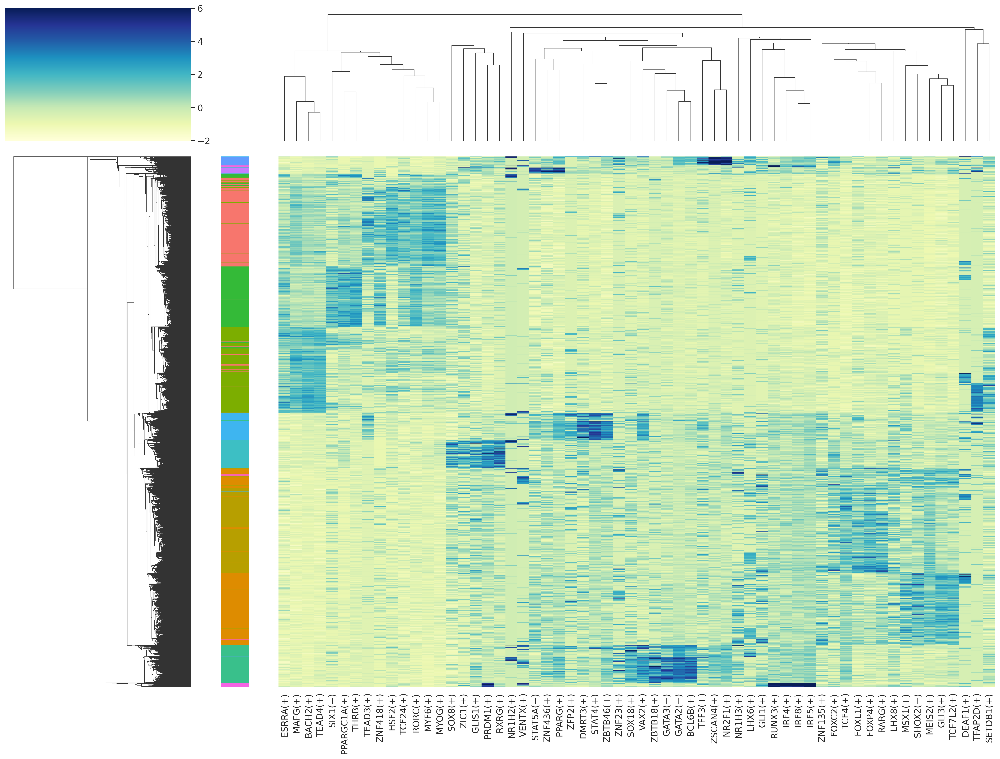

In [24]:
sns.set(font_scale=1.2)
g = sns.clustermap(auc_mtx_Z[topreg], annot=False,  square=False,  linecolor='gray',
    yticklabels=False, xticklabels=True, vmin=-2, vmax=6, row_colors=colormap,
    cmap="YlGnBu", figsize=(21,16) )
g.cax.set_visible(True)
g.ax_heatmap.set_ylabel('')
g.ax_heatmap.set_xlabel('')
g.savefig("heatmap-hamstring-top5regulons.svg")
#savesvg("heatmap-hamstring-top5regulons.svg", g)

# Visualising Cell-type Regulons with UMAPs

In [5]:
# combining auc_mtx with the h5ad file
adata_genes=sc.read_h5ad("hamstring_cellxgene_annotated.h5ad")
adata_genes

AnnData object with n_obs × n_vars = 10533 × 22769
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'external_gene_name', 'chromosome_name', 'gene_id', 'n_counts'
    uns: 'cell_type_colors'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'

In [14]:
lf = lp.connect("hamstring.scenic.loom", mode='r+', validate=False )
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons
lf.close()

In [7]:
adata=sc.AnnData(auc_mtx, obs=adata_genes.obs, obsm=adata_genes.obsm)
adata

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  


AnnData object with n_obs × n_vars = 10533 × 317
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'

In [8]:
adata.var

""
AHR(+)
AR(+)
ARID3A(+)
ARNT(+)
ARNT2(+)
...
ZNF84(+)
ZNF845(+)
ZNF91(+)
ZSCAN31(+)


In [9]:
genes=adata_genes.var_names
genes

Index(['STPG1', 'NIPAL3', 'SPRTN', 'FAM76A', 'VPS13D', 'MYOC', 'TARBP1',
       'THAP3', 'VAMP3', 'UTS2',
       ...
       'ENSG00000253449', 'LINC01947', 'GLYATL3', 'SPDEF', 'NRSN1', 'CT69',
       'ENSG00000234675', 'ENSG00000261696', 'SSX1', 'LINC01546'],
      dtype='object', name='Gene', length=22769)

In [10]:
common=genes[genes.isin(np.array(list(map(lambda x: x.split("(")[0],adata.var_names))))]
common

Index(['TBX15', 'GRHL3', 'MYOG', 'RBBP5', 'PRDM16', 'SETDB1', 'SOX13', 'ELK4',
       'TAL1', 'LHX8',
       ...
       'HCFC1', 'PHF8', 'KLF8', 'AR', 'GATA1', 'ZNF544', 'HOXD11', 'NKX2-5',
       'HOXA6', 'NOBOX'],
      dtype='object', name='Gene', length=317)

In [11]:
adata=adata[:,common+"(+)"]
adata_genes=adata_genes[:,common]
adata_genes.var
adata.layers["auc_init"]=adata.X.copy()
weights=adata_genes.X.copy()
weights[weights>1]=1
adata.X=adata.X*weights.A
adata.layers["weights"]=weights
adata

AnnData object with n_obs × n_vars = 10533 × 317
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'
    layers: 'auc_init', 'weights'

In [12]:
sc.pp.filter_genes(adata,min_cells=10)

In [13]:
adata

AnnData object with n_obs × n_vars = 10533 × 298
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID'
    var: 'n_cells'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'
    layers: 'auc_init', 'weights'

In [14]:
adata.var.head(10)

,n_cells
TBX15(+),3590
GRHL3(+),10
MYOG(+),195
RBBP5(+),938
PRDM16(+),236
SETDB1(+),1320
SOX13(+),1537
ELK4(+),744
TAL1(+),107
LHX8(+),22


In [21]:
#rerun the motif loading and this command:
df_motifs = load_motifs('hamstring.motifs.csv')
regulons = derive_regulons(df_motifs)

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:15: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from ipykernel import kernelapp as app
/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:16: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


Create regulons from a dataframe of enriched features.
Additional columns saved: []


In [22]:
len(regulons)

117

In [27]:
add_scenic_metadata(adata_genes, auc_mtx, regulons)
adata_genes
#adata_genes.write_h5ad(ANNDATA_FNAME) # results/hamstring.h5ad

AnnData object with n_obs × n_vars = 10533 × 317
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID', 'Regulon(AHR(+))_x', 'Regulon(AR(+))_x', 'Regulon(ARID3A(+))_x', 'Regulon(ARNT(+))_x', 'Regulon(ARNT2(+))_x', 'Regulon(ATF1(+))_x', 'Regulon(ATF2(+))_x', 'Regulon(ATF3(+))_x', 'Regulon(ATF4(+))_x', 'Regulon(ATF6(+))_x', 'Regulon(BACH1(+))_x', 'Regulon(BACH2(+))_x', 'Regulon(BCL11A(+))_x', 'Regulon(BCL3(+))_x', 'Regulon(BCL6B(+))_x', 'Regulon(BCLAF1(+))_x', 'Regulon(BHLHE40(+))_x', 'Regulon(BPTF(+))_x', 'Regulon(BRF1(+))_x', 'Regulon(CEBPB(+))_x', 'Regulon(CEBPG(+))_x', 'Regulon(CHD1(+))_x', 'Regulon(CHD2(+))_x', 'Regulon(CLOCK(+))_x', 'Regulon(CPEB1(+))_x', 'Regulo

In [24]:
adata_genes = sc.read_h5ad(ANNDATA_FNAME)
adata_genes

AnnData object with n_obs × n_vars = 10533 × 317
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'scDblFinder.score', 'scDblFinder.weighted', 'scDblFinder.cxds_score', 'decontX_contamination', 'decontX_clusters', 'sex', 'age', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'RNA_snn_res.0.1', 'RNA_snn_res.0.15', 'cell_type', 'barcode', 'CellID', 'Regulon(AHR(+))_x', 'Regulon(AR(+))_x', 'Regulon(ARID3A(+))_x', 'Regulon(ARNT(+))_x', 'Regulon(ARNT2(+))_x', 'Regulon(ATF1(+))_x', 'Regulon(ATF2(+))_x', 'Regulon(ATF3(+))_x', 'Regulon(ATF4(+))_x', 'Regulon(ATF6(+))_x', 'Regulon(BACH1(+))_x', 'Regulon(BACH2(+))_x', 'Regulon(BCL11A(+))_x', 'Regulon(BCL3(+))_x', 'Regulon(BCL6B(+))_x', 'Regulon(BCLAF1(+))_x', 'Regulon(BHLHE40(+))_x', 'Regulon(BPTF(+))_x', 'Regulon(BRF1(+))_x', 'Regulon(CEBPB(+))_x', 'Regulon(CEBPG(+))_x', 'Regulon(CHD1(+))_x', 'Regulon(CHD2(+))_x', 'Regulon(CLOCK(+))_x', 'Regulon(CPEB1(+))_x', 'Regulo

In [29]:
df_obs = adata_genes.obs
signature_column_names = list(df_obs.select_dtypes('number').columns)
signature_column_names = list(filter(lambda s: s.startswith('Regulon('), signature_column_names))
df_scores = df_obs[signature_column_names + ['cell_type']]
df_results = ((df_scores.groupby(by='cell_type').mean() - df_obs[signature_column_names].mean())/ df_obs[signature_column_names].std()).stack().reset_index().rename(columns={'level_1': 'regulon', 0:'Z'})
df_results['regulon'] = list(map(lambda s: s[8:-1], df_results.regulon))
df_results[(df_results.Z >= 3.0)].sort_values('Z', ascending=False).head()

,cell_type,regulon,Z
3411,Immune cells,SPI1(+),7.267414
3389,Immune cells,RUNX3(+),7.213677
3284,Immune cells,IKZF1(+),6.906771
3289,Immune cells,IRF8(+),6.871717
3286,Immune cells,IRF4(+),6.578974


In [30]:
df_results[(df_results.Z >= 3.0)].sort_values('Z', ascending=False)

,cell_type,regulon,Z
3411,Immune cells,SPI1(+),7.267414
3389,Immune cells,RUNX3(+),7.213677
3284,Immune cells,IKZF1(+),6.906771
3289,Immune cells,IRF8(+),6.871717
3286,Immune cells,IRF4(+),6.578974
3287,Immune cells,IRF5(+),6.557525
2852,Lymphatic endothelium,ZSCAN4(+),6.317451
2716,Lymphatic endothelium,NR2F1(+),5.827213
3051,Adipocytes,PPARG(+),4.895338
3315,Immune cells,MAF(+),4.815494


In [119]:
df_results.sort_values('Z', ascending=False).groupby(by='cell_type').head(2)

,cell_type,regulon,Z
3411,Immune cells,SPI1(+),7.267414
3389,Immune cells,RUNX3(+),7.213677
2852,Lymphatic endothelium,ZSCAN4(+),6.317451
2716,Lymphatic endothelium,NR2F1(+),5.827213
3051,Adipocytes,PPARG(+),4.895338
3156,Adipocytes,ZNF436(+),4.324282
2466,Mural cells,STAT4(+),3.563314
2124,Satellite cells,RXRG(+),3.243931
2400,Mural cells,NR2F2(+),3.240029
1666,Vascular endothelium,GATA2(+),3.181688


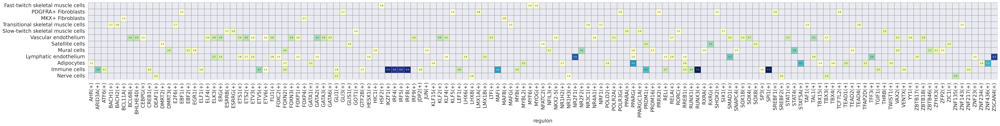

In [120]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 1.4].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
#df_heatmap.drop(index='Myocyte', inplace=True) # We leave out Myocyte because many TFs are highly enriched (becuase of small number of cells).
fig, ax1 = plt.subplots(1, 1, figsize=(40, 15))
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=False, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 6})
ax1.set_ylabel('')
savesvg('hamstring regulons Z-scores.png', fig)

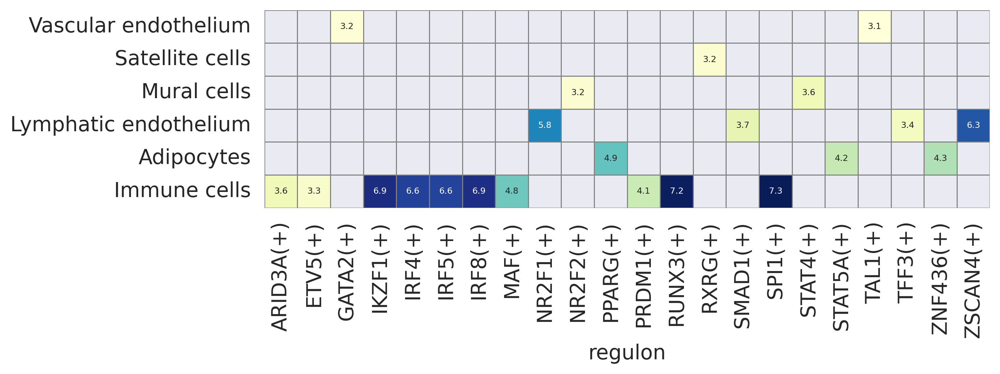

In [121]:
df_heatmap = pd.pivot_table(data=df_results[df_results.Z >= 3.0].sort_values('Z', ascending=False),
                           index='cell_type', columns='regulon', values='Z')
#df_heatmap.drop(index='Myocyte', inplace=True) # We leave out Myocyte because many TFs are highly enriched (becuase of small number of cells).
fig, ax1 = plt.subplots(1, 1, figsize=(10, 10))
sns.heatmap(df_heatmap, ax=ax1, annot=True, fmt=".1f", linewidths=.7, cbar=False, square=True, linecolor='gray', 
            cmap="YlGnBu", annot_kws={"size": 6})
ax1.set_ylabel('')
savesvg('hamstring regulons Z-scores_3min.png', fig)

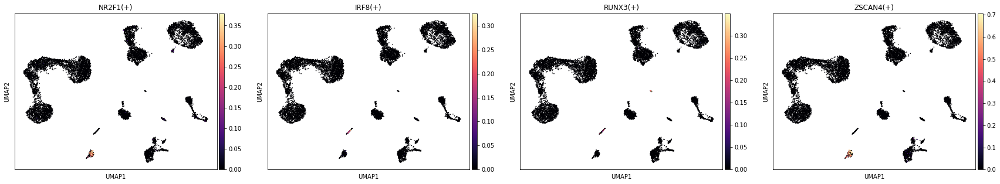

In [31]:
sc.pl.umap(adata, color=["NR2F1(+)", "IRF8(+)", "RUNX3(+)", "ZSCAN4(+)"], cmap='magma')

# Clustering based on regulon activity

In [32]:
sc.pp.neighbors(adata_genes, n_pcs =50, use_rep = 'X_aucell')
sc.tl.umap(adata_genes)

In [33]:
sc.tl.tsne(adata_genes, n_pcs = 50, use_rep = 'X_aucell')

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/sklearn/manifold/_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


In [34]:
adata.obs['cell_type'].cat.categories

Index(['Fast-twitch skeletal muscle cells', 'PDGFRA+ Fibroblasts',
       'MKX+ Fibroblasts', 'Transitional skeletal muscle cells',
       'Slow-twitch skeletal muscle cells', 'Vascular endothelium',
       'Satellite cells', 'Mural cells', 'Lymphatic endothelium', 'Adipocytes',
       'Immune cells', 'Nerve cells'],
      dtype='object')

In [35]:
adata.obs["cell_type"] = (adata.obs["cell_type"].cat.reorder_categories(sorted(adata.obs["cell_type"].cat.categories)))
adata_genes.obs["cell_type"] = (adata_genes.obs["cell_type"].cat.reorder_categories(sorted(adata_genes.obs["cell_type"].cat.categories)))

In [36]:
adata.obs['cell_type'].cat.categories

Index(['Adipocytes', 'Fast-twitch skeletal muscle cells', 'Immune cells',
       'Lymphatic endothelium', 'MKX+ Fibroblasts', 'Mural cells',
       'Nerve cells', 'PDGFRA+ Fibroblasts', 'Satellite cells',
       'Slow-twitch skeletal muscle cells',
       'Transitional skeletal muscle cells', 'Vascular endothelium'],
      dtype='object')

In [38]:
seurat_col = sns.color_palette(['#c77cff',
                                '#F7766D',
                                '#F564E4',
                                '#619CFF',
                                '#B79F00',
                                '#3EB5F0',
                                '#F764B0',
                                '#DE8C00',
                                '#3DBFC4',
                                '#34BA38',
                                '#7CAE00',
                                '#39C08B'])
#adata.uns['cell_type_colors']

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: This figure was using constrained_layout, but that is incompatible with subplots_adjust and/or tight_layout; disabling constrained_layout.
  """


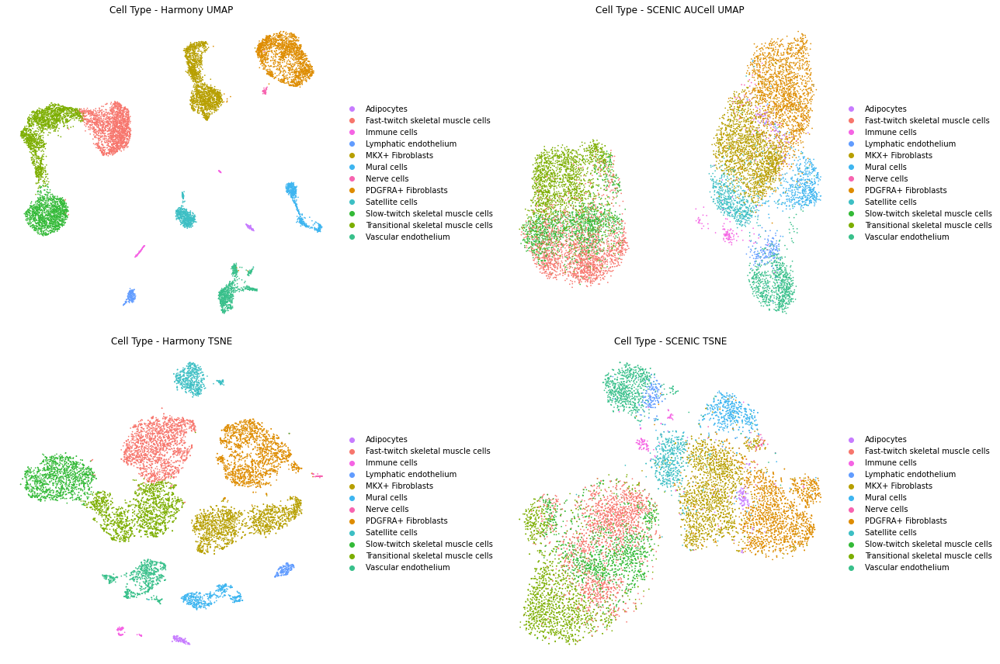

In [39]:
fig, axs = plt.subplots(2, 2, figsize=(18,12), constrained_layout=True)
sc.pl.embedding(adata,color=["cell_type"],basis='X_umap', title="Cell Type - Harmony UMAP", ax=axs[0,0], show=False, frameon=False, palette=seurat_col)
sc.pl.embedding(adata_genes,color=["cell_type"],basis='X_umap', title="Cell Type - SCENIC AUCell UMAP", ax=axs[0,1], show=False, frameon=False, palette=seurat_col)
sc.pl.embedding(adata,color=["cell_type"],basis='X_tsne',title="Cell Type - Harmony TSNE", ax=axs[1,0], show=False, frameon=False, palette=seurat_col)
sc.pl.embedding(adata_genes,color=["cell_type"],basis='X_tsne',title="Cell Type - SCENIC TSNE", ax=axs[1,1], show=False, frameon=False, palette=seurat_col)
savesvg('UMAPs_seuratcols_harmonyvsscenic.svg', fig)

In [127]:
ddf = pd.DataFrame(adata_genes.obsm['X_umap'],columns=['X', 'Y'], index=auc_mtx.index)
ddf

,X,Y
AAACCCAAGAAGTCCG.HAM_OMB1216,-2.393765,4.112420
AAACCCAAGTTCATCG.HAM_OMB1216,0.387419,4.417569
AAACGAACACATTCGA.HAM_OMB1216,0.803988,5.423304
AAACGAACATGGAGAC.HAM_OMB1216,-2.611264,5.756577
AAACGAATCCTCATAT.HAM_OMB1216,0.964590,6.866430
...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,12.286310,12.986015
TTTGGTTCAGTAGATA.HAM_OMB0782,11.038187,9.718862
TTTGTTGAGTGCAGCA.HAM_OMB0782,1.450898,8.702222
TTTGTTGCATGTACGT.HAM_OMB0782,0.689395,8.333926


In [40]:
adata_genes.write_h5ad(ANNDATA_FNAME)

## Exporting to SCope

In [21]:
adata = sc.read_h5ad("hamstring_cellxgene_annotated.h5ad")
adata

AnnData object with n_obs × n_vars = 11894 × 22987
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nUMI', 'nGene', 'log10GenesPerUMI', 'sample', 'mtUMI', 'mitoRatio', 'sex', 'age', 'surgery', 'batch', 'side', 'RNA_snn_res.0.2', 'seurat_clusters', 'cell_type', 'barcode', 'CellID'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable', 'external_gene_name', 'chromosome_name', 'gene_id', 'n_counts'
    obsm: 'X_harmony', 'X_pca', 'X_tsne', 'X_umap'

In [130]:
import json
import zlib
import base64
import umap
from MulticoreTSNE import MulticoreTSNE as TSNE

# scenic output
lf = lp.connect("hamstring.scenic.loom", mode='r+', validate=False )
meta = json.loads(zlib.decompress(base64.b64decode( lf.attrs.MetaData )))
auc_mtx = pd.DataFrame( lf.ca.RegulonsAUC, index=lf.ca.CellID)
regulons = lf.ra.Regulons

# UMAP
runUmap = umap.UMAP(n_neighbors=10, min_dist=0.4, metric='correlation').fit_transform
dr_umap = runUmap( auc_mtx )
dr_umap = pd.DataFrame(dr_umap, columns=['X', 'Y'], index=auc_mtx.index) #.to_csv( "results/scvi_3207/scenic_umap.txt", sep='\t')
# tSNE
tsne = TSNE( n_jobs=20 )
dr_tsne = tsne.fit_transform( auc_mtx )
dr_tsne = pd.DataFrame(dr_tsne, columns=['X', 'Y'], index=auc_mtx.index) #.to_csv( "results/scvi_3207/scenic_tsne.txt", sep='\t')

#dr_umap = pd.read_csv( 'scenic_umap.txt', sep='\t', header=0, index_col=0 )
#dr_tsne = pd.read_csv( 'scenic_tsne.txt', sep='\t', header=0, index_col=0 )
###

In [131]:
dr_umap

,X,Y
AAACCCAAGAAGTCCG.HAM_OMB1216,-0.021229,8.675014
AAACCCAAGTTCATCG.HAM_OMB1216,1.033113,7.518568
AAACGAACACATTCGA.HAM_OMB1216,0.275109,8.234898
AAACGAACATGGAGAC.HAM_OMB1216,-4.399479,3.983105
AAACGAATCCTCATAT.HAM_OMB1216,-5.397135,2.463156
...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,14.264437,0.059074
TTTGGTTCAGTAGATA.HAM_OMB0782,10.446878,0.019698
TTTGTTGAGTGCAGCA.HAM_OMB0782,-0.337077,7.462793
TTTGTTGCATGTACGT.HAM_OMB0782,-0.109302,3.741302


In [132]:
# Fix regulon objects to display properly
auc_mtx.columns = auc_mtx.columns.str.replace('\(','_(')
regulons.dtype.names = tuple( [ x.replace("(","_(") for x in regulons.dtype.names ] )
# regulon thresholds
rt = meta['regulonThresholds']
for i,x in enumerate(rt):
    tmp = x.get('regulon').replace("(","_(")
    x.update( {'regulon': tmp} )

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: The default value of regex will change from True to False in a future version.
  


In [133]:
# Concatenate embeddings (tSNE, UMAP, etc.)
tsneDF = pd.DataFrame(adata.obsm['X_tsne'], columns=['_X', '_Y'])

Embeddings_X = pd.DataFrame( index=lf.ca.CellID )
Embeddings_X = pd.concat( [
        pd.DataFrame(adata.obsm['X_harmony'],index=adata.obs.index)[0] ,
        pd.DataFrame(adata.obsm['X_umap'],index=adata.obs.index)[0] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[0] ,
        dr_tsne['X'] ,
        dr_umap['X']
    ], sort=False, axis=1, join='outer' )
Embeddings_X.columns = ['1','2','3','4', '5']

Embeddings_Y = pd.DataFrame( index=lf.ca.CellID )
Embeddings_Y = pd.concat( [
        pd.DataFrame(adata.obsm['X_harmony'],index=adata.obs.index)[1] , 
        pd.DataFrame(adata.obsm['X_umap'],index=adata.obs.index)[1] ,
        pd.DataFrame(adata.obsm['X_pca'],index=adata.obs.index)[1] ,
        dr_tsne['Y'] ,
        dr_umap['Y']
    ], sort=False, axis=1, join='outer' )
Embeddings_Y.columns = ['1','2','3','4', '5']

In [134]:
Embeddings_Y

,1,2,3,4,5
AAACCCAAGAAGTCCG.HAM_OMB1216,0.511220,1.886381,0.402750,-16.252018,8.675014
AAACCCAAGTTCATCG.HAM_OMB1216,0.140748,2.428297,0.071255,-12.193064,7.518568
AAACGAACACATTCGA.HAM_OMB1216,0.651802,0.796585,0.589778,-11.895633,8.234898
AAACGAACATGGAGAC.HAM_OMB1216,0.277082,-4.272174,0.307418,1.530567,3.983105
AAACGAATCCTCATAT.HAM_OMB1216,0.906635,-5.804136,0.941765,-3.496145,2.463156
...,...,...,...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,-7.887603,6.786252,-8.126567,-1.247558,0.059074
TTTGGTTCAGTAGATA.HAM_OMB0782,-5.220402,5.944070,-5.392654,-20.385980,0.019698
TTTGTTGAGTGCAGCA.HAM_OMB0782,0.478694,-0.612144,0.538493,-12.686808,7.462793
TTTGTTGCATGTACGT.HAM_OMB0782,0.048617,2.639782,0.274639,1.702081,3.741302


In [138]:
# Metadata
### metadata
metaJson = {}

metaJson['embeddings'] = [
    {
        "id": -1,
        "name": f"Seurat t-SNE (highly variable genes)"
    },
    {
        "id": 1,
        "name": f"Seurat Harmony"
    },
    {
        "id": 2,
        "name": f"Seurat UMAP (highly variable genes)"
    },
    {
        "id": 3,
        "name": "Seurat PC1/PC2"
    },
    {
        "id": 4,
        "name": "SCENIC AUC t-SNE"
    },
    {
        "id": 5,
        "name": "SCENIC AUC UMAP"
    },
]

metaJson["clusterings"] = [{
            "id": 0,
            "group": "Seurat",
            "name": "Seurat clusters",
            "clusters": [],
        }]

metaJson["metrics"] = [
        {
            "name": "nUMI"
        }, {
            "name": "nGene"
        }, {
            "name": "Percent_mito"
        }
]

metaJson["annotations"] = [
    {
        "name": "Seurat Clusters",
        "values": list(set( adata.obs['seurat_clusters'].astype(np.str) ))
    },
    {
        "name": "Batch",
        "values": list(set( adata.obs['batch'].astype(np.str) ))
    },
    {
        "name": "Side",
        "values": list(set( adata.obs['side'].astype(np.str) ))
    },
    {
        "name": "Cell type",
        "values": list(set( adata.obs['cell_type'].astype(np.str) ))
    },
    {
        "name": "Age",
        "values": list(set(adata.obs['age'].values))
    },
    {
        "name": "Sex",
        "values": list(set(adata.obs['sex'].values))
    },
    {
        "name": "Sample",
        "values": list(set(adata.obs['sample'].values))
    },
    {
        "name": "Orig.ident",
        "values": list(set(adata.obs['orig.ident'].values))
    }
]

# SCENIC regulon thresholds:
metaJson["regulonThresholds"] = rt

for i in range(max(set([int(x) for x in adata.obs['seurat_clusters']])) + 1):
    clustDict = {}
    clustDict['id'] = i
    clustDict['description'] = f'Seurat cluster: {i + 1}'
    metaJson['clusterings'][0]['clusters'].append(clustDict)
    
clusterings = pd.DataFrame()
clusterings["0"] = adata.obs['seurat_clusters'].values.astype(np.int64)

/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:52: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_launcher.py:56: DeprecationWarning: `np.str` is a deprecated alias for the builtin `str`. To silence this warning, use `str` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.str_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/home/a/akurjan/obds_conda/envs/pyscenic/lib/python3.7/site-packages/ipykernel_l

In [139]:
def dfToNamedMatrix(df):
    arr_ip = [tuple(i) for i in df.values]
    dtyp = np.dtype(list(zip(df.dtypes.index, df.dtypes)))
    arr = np.array(arr_ip, dtype=dtyp)
    return arr

In [140]:
adata.obs

,orig.ident,nCount_RNA,nFeature_RNA,nUMI,nGene,log10GenesPerUMI,sample,mtUMI,mitoRatio,scDblFinder.score,...,age,batch,side,RNA_snn_res.0.2,seurat_clusters,RNA_snn_res.0.1,RNA_snn_res.0.15,cell_type,barcode,CellID
CellID,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGAAGTCCG.HAM_OMB1216,HAM_OMB1216,3296.0,1588,3296.0,1588,0.909853,Hamstring0,23.0,0.006978,0.340008,...,37,28JAN2021,Right,0,0,0,0,Fast-twitch skeletal muscle cells,AAACCCAAGAAGTCCG,AAACCCAAGAAGTCCG.HAM_OMB1216
AAACCCAAGTTCATCG.HAM_OMB1216,HAM_OMB1216,2368.0,1128,2368.0,1128,0.904554,Hamstring0,30.0,0.012669,0.003623,...,37,28JAN2021,Right,2,0,0,0,Fast-twitch skeletal muscle cells,AAACCCAAGTTCATCG,AAACCCAAGTTCATCG.HAM_OMB1216
AAACGAACACATTCGA.HAM_OMB1216,HAM_OMB1216,1839.0,948,1839.0,948,0.911850,Hamstring0,27.0,0.014682,0.054006,...,37,28JAN2021,Right,2,0,0,0,Fast-twitch skeletal muscle cells,AAACGAACACATTCGA,AAACGAACACATTCGA.HAM_OMB1216
AAACGAACATGGAGAC.HAM_OMB1216,HAM_OMB1216,4179.0,1697,4179.0,1697,0.891913,Hamstring0,20.0,0.004786,0.004322,...,37,28JAN2021,Right,3,4,3,4,Slow-twitch skeletal muscle cells,AAACGAACATGGAGAC,AAACGAACATGGAGAC.HAM_OMB1216
AAACGAATCCTCATAT.HAM_OMB1216,HAM_OMB1216,2098.0,1235,2098.0,1235,0.930719,Hamstring0,25.0,0.011916,0.002427,...,37,28JAN2021,Right,3,4,3,4,Slow-twitch skeletal muscle cells,AAACGAATCCTCATAT,AAACGAATCCTCATAT.HAM_OMB1216
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTAGTGGACTG.HAM_OMB0782,HAM_OMB0782,2077.0,1150,2077.0,1150,0.922609,Hamstring5,30.0,0.014444,0.234771,...,18,16MAR2021,Left,1,1,1,1,PDGFRA+ Fibroblasts,TTTGACTAGTGGACTG,TTTGACTAGTGGACTG.HAM_OMB0782
TTTGGTTCAGTAGATA.HAM_OMB0782,HAM_OMB0782,2046.0,993,2046.0,993,0.905175,Hamstring5,16.0,0.007820,0.171304,...,18,16MAR2021,Left,6,2,2,2,MKX+ Fibroblasts,TTTGGTTCAGTAGATA,TTTGGTTCAGTAGATA.HAM_OMB0782
TTTGTTGAGTGCAGCA.HAM_OMB0782,HAM_OMB0782,4891.0,1852,4891.0,1852,0.885684,Hamstring5,11.0,0.002249,0.256161,...,18,16MAR2021,Left,2,0,0,0,Fast-twitch skeletal muscle cells,TTTGTTGAGTGCAGCA,TTTGTTGAGTGCAGCA.HAM_OMB0782


In [141]:
col_attrs = {
    "CellID": np.array(adata.obs.index),
    "nUMI": np.array(adata.obs['nUMI'].values),
    "nGene": np.array(adata.obs['nGene'].values),
    "Cell type": np.array(adata.obs['cell_type'].values),
    "Sex": np.array(adata.obs['sex'].values),
    "Sample": np.array(adata.obs['sample'].values),
    "Age": np.array(adata.obs['age'].values),
    "Batch": np.array(adata.obs['batch'].values),
    "Percent_mito": np.array(adata.obs['mitoRatio'].values),
    "Seurat Clusters": np.array(adata.obs['seurat_clusters'].values),
    "Orig.ident": np.array(adata.obs['orig.ident'].values),
    "Embedding": dfToNamedMatrix(tsneDF),
    "Embeddings_X": dfToNamedMatrix(Embeddings_X),
    "Embeddings_Y": dfToNamedMatrix(Embeddings_Y),
    "RegulonsAUC": dfToNamedMatrix(auc_mtx),
    "Clusterings": dfToNamedMatrix(clusterings),
    "ClusterID": np.array(adata.obs['seurat_clusters'].values)
}

row_attrs = {
    "Gene": lf.ra.Gene,
    "Regulons": regulons,
}

attrs = {
    "title": "sampleTitle",
    "MetaData": json.dumps(metaJson),
    "Genome": 'hg38',
    "SCopeTreeL1": "",
    "SCopeTreeL2": "",
    "SCopeTreeL3": ""
}

# compress the metadata field:
attrs['MetaData'] = base64.b64encode(zlib.compress(json.dumps(metaJson).encode('ascii'))).decode('ascii')


In [142]:
lp.create(
    filename = 'hamstring_scope.loom' ,
    layers=lf[:,:],
    row_attrs=row_attrs, 
    col_attrs=col_attrs, 
    file_attrs=attrs
)
lf.close() # close original pyscenic loom file